<h1 align= center style="color:tomato;">Stock market Analysis Project</h1>

In [3]:
# import libraries
import pandas as pd 
import numpy as np
import matplotlib.pyplot as plt
from scipy.interpolate import make_interp_spline
import math
import datetime as dt
from statsmodels.tsa.seasonal import seasonal_decompose


# Importing Dataset 

In [2]:
# create empty list and directory to store nifty 50 files
df={}
stocklist=[]
import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))
        stocklist.append(filename)
        df[filename]= pd.read_csv(os.path.join(dirname, filename))



/kaggle/input/nifty50-stock-market-data/HDFCBANK.csv
/kaggle/input/nifty50-stock-market-data/GRASIM.csv
/kaggle/input/nifty50-stock-market-data/WIPRO.csv
/kaggle/input/nifty50-stock-market-data/stock_metadata.csv
/kaggle/input/nifty50-stock-market-data/BPCL.csv
/kaggle/input/nifty50-stock-market-data/INFY.csv
/kaggle/input/nifty50-stock-market-data/LT.csv
/kaggle/input/nifty50-stock-market-data/RELIANCE.csv
/kaggle/input/nifty50-stock-market-data/BRITANNIA.csv
/kaggle/input/nifty50-stock-market-data/INFRATEL.csv
/kaggle/input/nifty50-stock-market-data/HEROMOTOCO.csv
/kaggle/input/nifty50-stock-market-data/HINDUNILVR.csv
/kaggle/input/nifty50-stock-market-data/TATAMOTORS.csv
/kaggle/input/nifty50-stock-market-data/MM.csv
/kaggle/input/nifty50-stock-market-data/HDFC.csv
/kaggle/input/nifty50-stock-market-data/JSWSTEEL.csv
/kaggle/input/nifty50-stock-market-data/TITAN.csv
/kaggle/input/nifty50-stock-market-data/HINDALCO.csv
/kaggle/input/nifty50-stock-market-data/AXISBANK.csv
/kaggle/inpu

# Viewing Dataset 

In [4]:
df['NIFTY50_all.csv'].head()

,Date,Symbol,Series,Prev Close,Open,High,Low,Last,Close,VWAP,Volume,Turnover,Trades,Deliverable Volume,%Deliverble
0,2007-11-27,MUNDRAPORT,EQ,440.00,770.00,1050.00,770.0,959.0,962.90,984.72,27294366,2.687719e+15,NaN,9859619.0,0.3612
1,2007-11-28,MUNDRAPORT,EQ,962.90,984.00,990.00,874.0,885.0,893.90,941.38,4581338,4.312765e+14,NaN,1453278.0,0.3172
2,2007-11-29,MUNDRAPORT,EQ,893.90,909.00,914.75,841.0,887.0,884.20,888.09,5124121,4.550658e+14,NaN,1069678.0,0.2088
3,2007-11-30,MUNDRAPORT,EQ,884.20,890.00,958.00,890.0,929.0,921.55,929.17,4609762,4.283257e+14,NaN,1260913.0,0.2735
4,2007-12-03,MUNDRAPORT,EQ,921.55,939.75,995.00,922.0,980.0,969.30,965.65,2977470,2.875200e+14,NaN,816123.0,0.2741


In [5]:
type(df['TITAN.csv'].Date)

pandas.core.series.Series

In [6]:
df['TITAN.csv'].dtypes

Date                   object
Symbol                 object
Series                 object
Prev Close            float64
Open                  float64
High                  float64
Low                   float64
Last                  float64
Close                 float64
VWAP                  float64
Volume                  int64
Turnover              float64
Trades                float64
Deliverable Volume    float64
%Deliverble           float64
dtype: object

In [7]:
# print dataframe name and its value
for key, value in df.items():
    print("Dataframe:", key)
    print(type(value))

Dataframe: HDFCBANK.csv
<class 'pandas.core.frame.DataFrame'>
Dataframe: GRASIM.csv
<class 'pandas.core.frame.DataFrame'>
Dataframe: WIPRO.csv
<class 'pandas.core.frame.DataFrame'>
Dataframe: stock_metadata.csv
<class 'pandas.core.frame.DataFrame'>
Dataframe: BPCL.csv
<class 'pandas.core.frame.DataFrame'>
Dataframe: INFY.csv
<class 'pandas.core.frame.DataFrame'>
Dataframe: LT.csv
<class 'pandas.core.frame.DataFrame'>
Dataframe: RELIANCE.csv
<class 'pandas.core.frame.DataFrame'>
Dataframe: BRITANNIA.csv
<class 'pandas.core.frame.DataFrame'>
Dataframe: INFRATEL.csv
<class 'pandas.core.frame.DataFrame'>
Dataframe: HEROMOTOCO.csv
<class 'pandas.core.frame.DataFrame'>
Dataframe: HINDUNILVR.csv
<class 'pandas.core.frame.DataFrame'>
Dataframe: TATAMOTORS.csv
<class 'pandas.core.frame.DataFrame'>
Dataframe: MM.csv
<class 'pandas.core.frame.DataFrame'>
Dataframe: HDFC.csv
<class 'pandas.core.frame.DataFrame'>
Dataframe: JSWSTEEL.csv
<class 'pandas.core.frame.DataFrame'>
Dataframe: TITAN.csv
<cl

In [8]:
df_calculate = pd.DataFrame(columns=['stockname', 'daily_ret','vol_corr'])

for file_name, values in df.items():
    row=[]
    print(f"CSV File: {file_name}")
    print(f"Shape of the dataframe: {values.shape}")
    if 'Close' in values.columns  and 'Open' in values.columns:
        values['Date'] = pd.to_datetime(values['Date'])
        
        #values['Date'] = (values['Date']).dt.strftime("%Y%m%d")
        values['daily_ret'] = (values['Close'] - values['Open'])
        row.append(file_name)
        row.append(values['daily_ret'].mean())
        row.append(values['Close'].corr(values['Volume']))
        print(row)
        
        
        df_calculate = pd.concat([df_calculate, pd.DataFrame([row], 
                        columns=df_calculate.columns)], ignore_index=True)
        
 

CSV File: HDFCBANK.csv
Shape of the dataframe: (5306, 15)
['HDFCBANK.csv', -0.14237655484357548, 0.13122411626888922]
CSV File: GRASIM.csv
Shape of the dataframe: (5306, 15)
['GRASIM.csv', -0.5145401432340765, -0.30996963499031427]
CSV File: WIPRO.csv
Shape of the dataframe: (5306, 15)
['WIPRO.csv', -2.3251978891820584, -0.17288583099536597]
CSV File: stock_metadata.csv
Shape of the dataframe: (50, 5)
CSV File: BPCL.csv
Shape of the dataframe: (5306, 15)
['BPCL.csv', -0.6365906520919712, 0.0018302577452746574]
CSV File: INFY.csv
Shape of the dataframe: (5306, 15)
['INFY.csv', -2.7800508857896693, -0.38795880365066754]
CSV File: LT.csv
Shape of the dataframe: (4184, 15)
['LT.csv', -2.2849306883365195, -0.29735303128982726]
CSV File: RELIANCE.csv
Shape of the dataframe: (5306, 15)
['RELIANCE.csv', -1.285535243120996, 0.14994672097869227]
CSV File: BRITANNIA.csv
Shape of the dataframe: (5305, 15)
['BRITANNIA.csv', -1.6807068803015999, 0.40233228632946805]
CSV File: INFRATEL.csv
Shape of t

In [9]:
df['INDUSINDBK.csv'].dtypes

Date                  datetime64[ns]
Symbol                        object
Series                        object
Prev Close                   float64
Open                         float64
High                         float64
Low                          float64
Last                         float64
Close                        float64
VWAP                         float64
Volume                         int64
Turnover                     float64
Trades                       float64
Deliverable Volume           float64
%Deliverble                  float64
daily_ret                    float64
dtype: object

<h3 style="color:red;"> 
 1 . What is the average daily return of each stock in the NIFTY50 index? 
    
 2 .Which stock has the highest average return and which stock has the lowest average return?</h3>


In [10]:
# daily return and volume corelation coefficient for each stock in below table
df_calculate.head(52)

,stockname,daily_ret,vol_corr
0,HDFCBANK.csv,-0.142377,0.131224
1,GRASIM.csv,-0.514540,-0.309970
2,WIPRO.csv,-2.325198,-0.172886
3,BPCL.csv,-0.636591,0.001830
4,INFY.csv,-2.780051,-0.387959
5,LT.csv,-2.284931,-0.297353
6,RELIANCE.csv,-1.285535,0.149947
7,BRITANNIA.csv,-1.680707,0.402332
8,INFRATEL.csv,NaN,NaN
9,HEROMOTOCO.csv,-1.507199,0.182899


In [16]:

#stock with highest average return and  stock has the lowest average return?**
min_value = min(df_calculate['daily_ret'])
low_stock =df_calculate.loc[df_calculate['daily_ret'] == min_value]
print("Low Stock : ")
print(low_stock)

print(".........................................")

max_value = max(df_calculate['daily_ret'])
high_stock =df_calculate.loc[df_calculate['daily_ret'] == max_value]

print("High stock  : ")
print(high_stock)





Low Stock : 
        stockname  daily_ret  vol_corr
33  EICHERMOT.csv  -9.952537  0.002447
.........................................
High stock  : 
         stockname  daily_ret  vol_corr
23  BAJFINANCE.csv  -0.048319  0.263714


In [18]:
for file_name, stocks in df.items():
    print(file_name)
    print(stocks.head())

HDFCBANK.csv
        Date    Symbol Series  Prev Close    Open    High     Low    Last  \
0 2000-01-03  HDFCBANK     EQ      157.40  166.00  170.00  166.00  170.00   
1 2000-01-04  HDFCBANK     EQ      170.00  182.00  183.45  171.00  174.00   
2 2000-01-05  HDFCBANK     EQ      173.80  170.00  173.90  165.00  168.00   
3 2000-01-06  HDFCBANK     EQ      166.95  168.00  170.00  165.30  168.95   
4 2000-01-07  HDFCBANK     EQ      168.30  162.15  171.00  162.15  170.75   

    Close    VWAP  Volume      Turnover  Trades  Deliverable Volume  \
0  170.00  169.52   33259  5.638122e+11     NaN                 NaN   
1  173.80  174.99  168710  2.952261e+12     NaN                 NaN   
2  166.95  169.20  159820  2.704094e+12     NaN                 NaN   
3  168.30  168.44   85026  1.432166e+12     NaN                 NaN   
4  168.35  166.79   85144  1.420158e+12     NaN                 NaN   

   %Deliverble  daily_ret  
0          NaN       4.00  
1          NaN      -8.20  
2          Na

<h3 style="color:red;"> 2. Is there any correlation between the daily trading volume and the closing price of the stocks in the NIFTY50 index? Calculate the correlation coefficient for each stock.</h3>

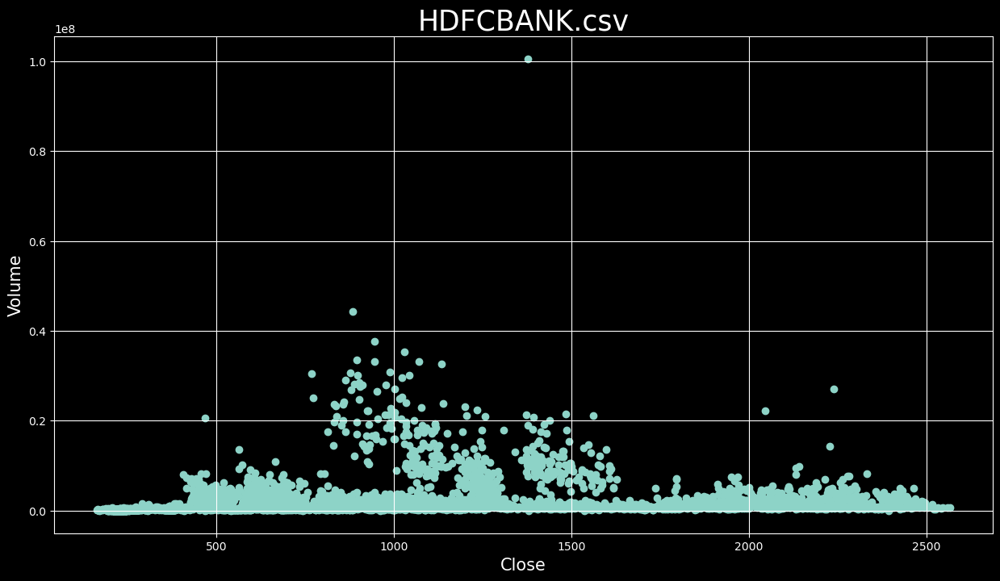

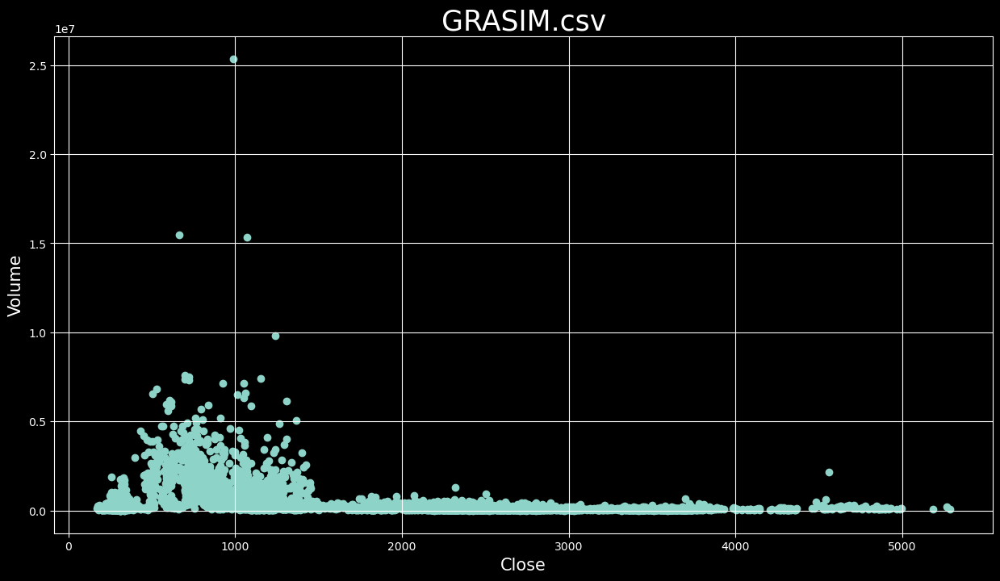

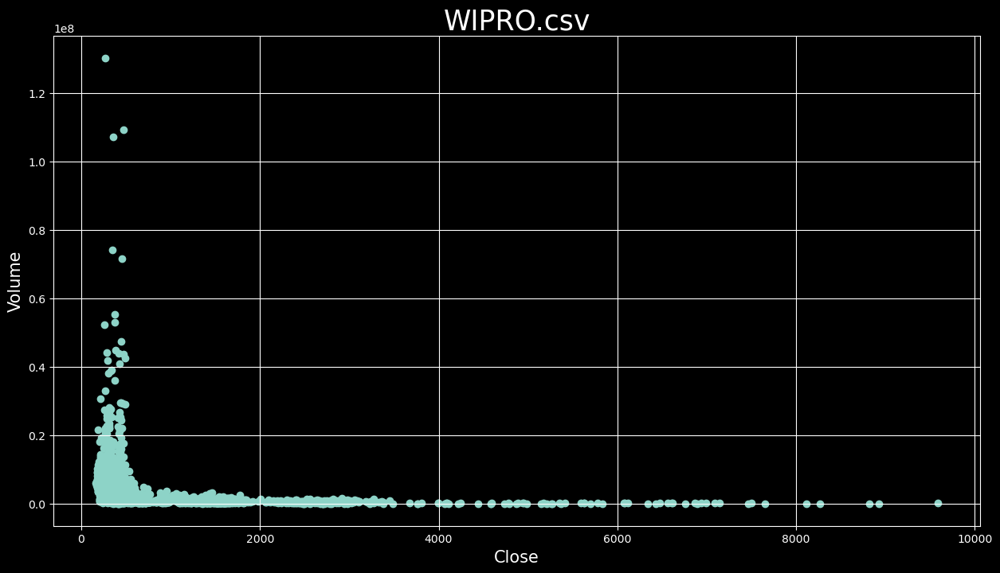

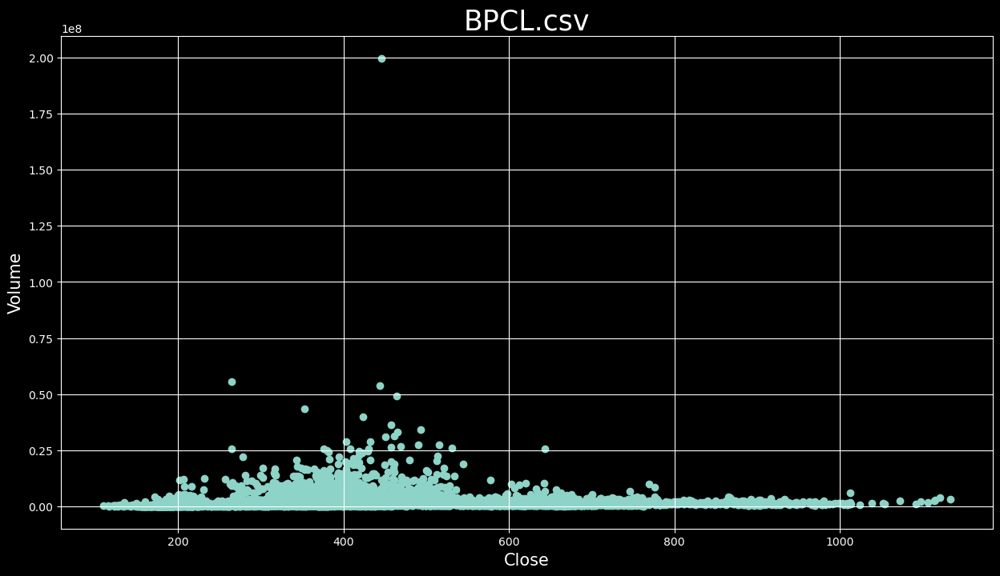

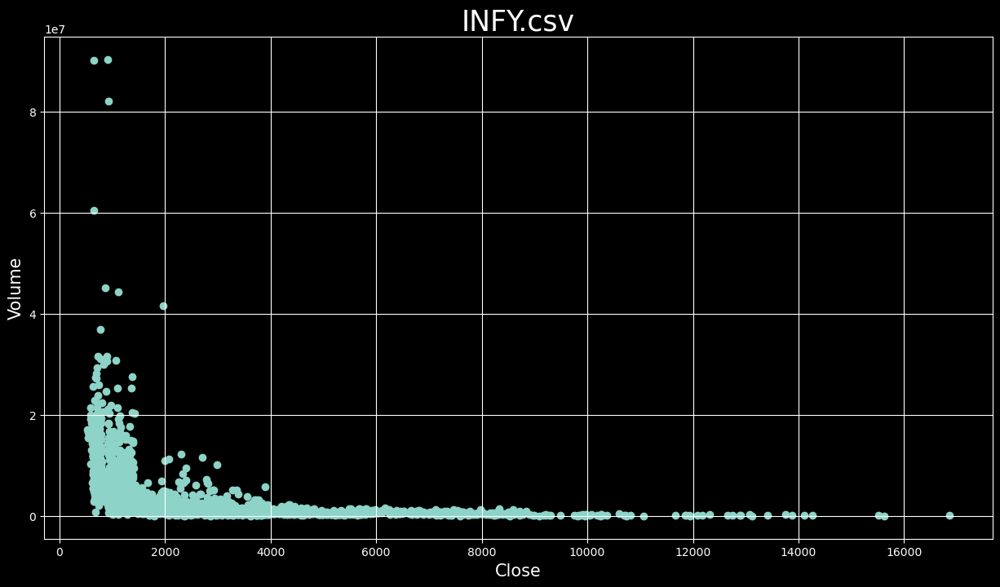

...

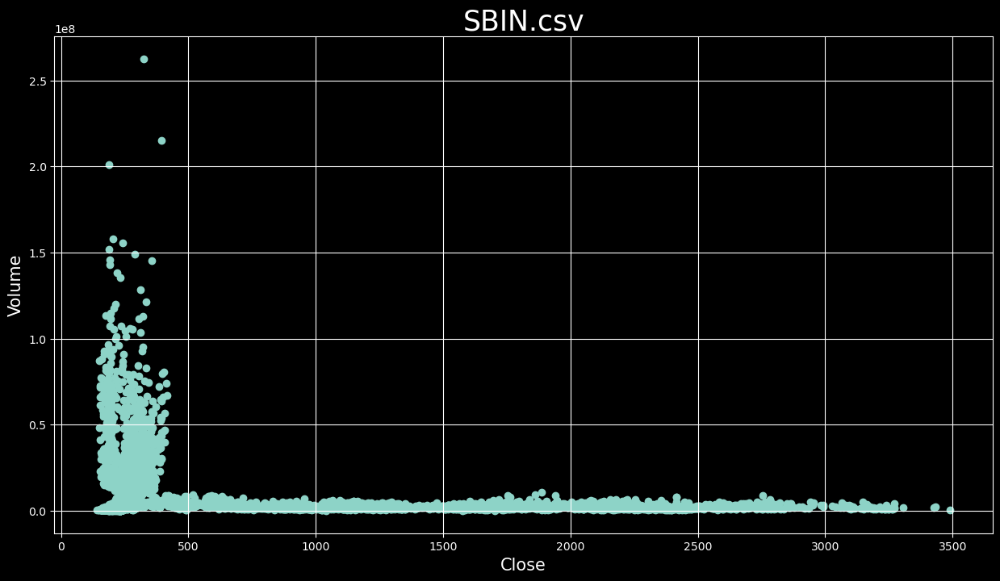

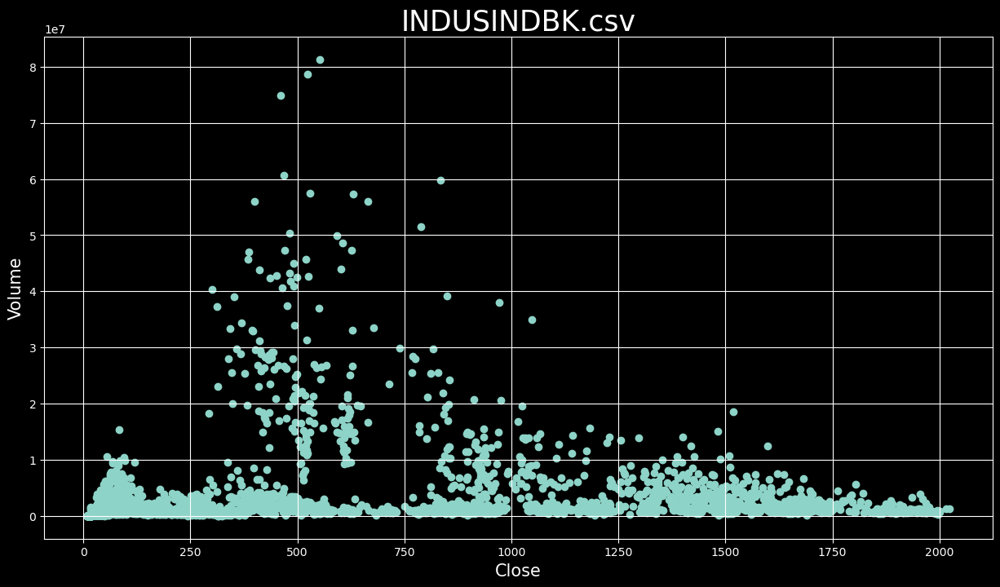

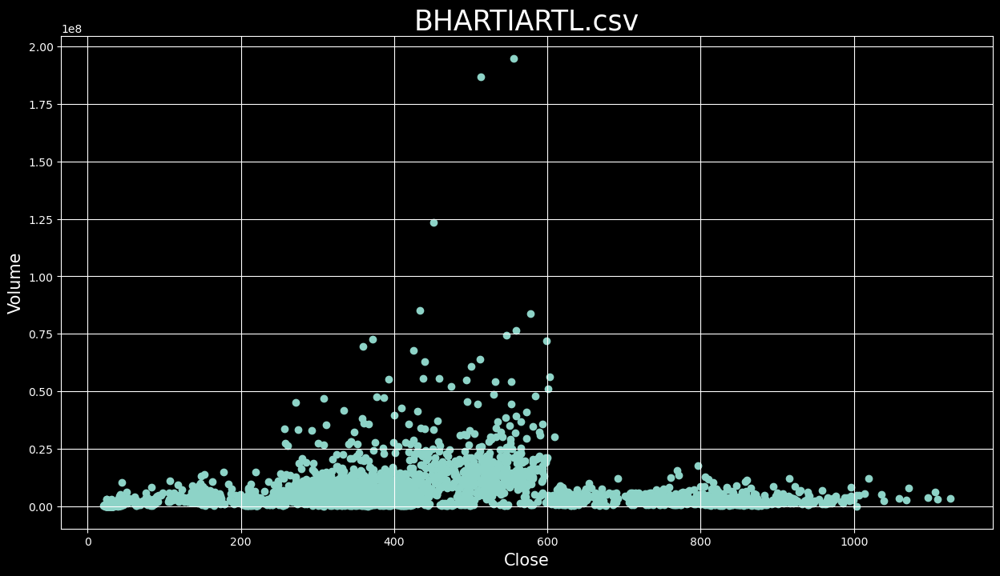

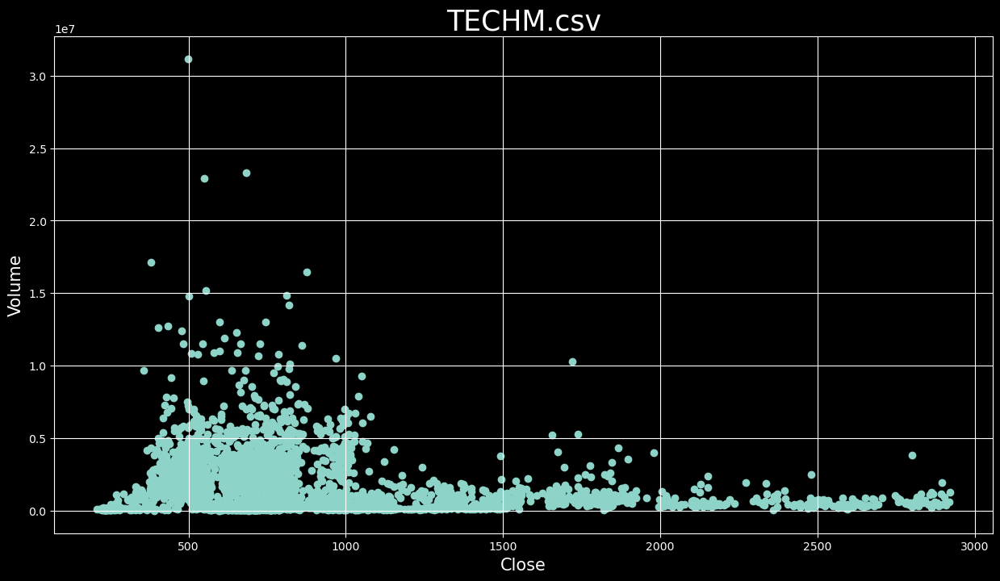

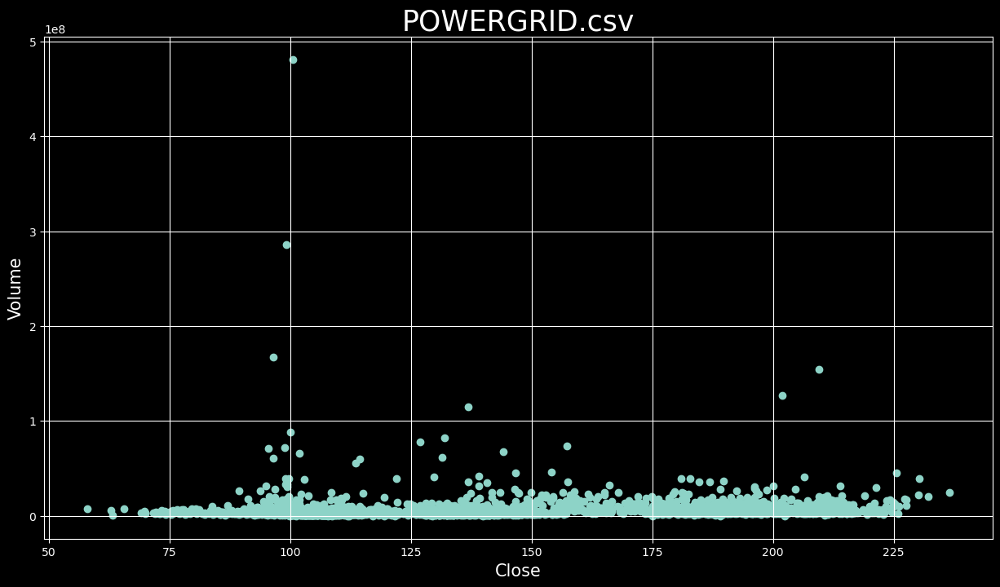

In [30]:
# plotting the correlation between the daily trading volume and the closing price of 
# the stocks

for file_name, values in df.items():
    if 'Close' in values.columns  and 'Open' in values.columns:
        plt.figure(figsize = (15,8))
        plt.style.use("dark_background")
        plt.scatter(values['Close'], values['Volume'])
        plt.title(file_name,fontsize = 25)
        plt.xlabel('Close',fontsize = 15)
        plt.ylabel('Volume',fontsize = 15)
        plt.grid()
        plt.show()

<h3 style="color:red;">3. What is the overall trend of the NIFTY50 index? Calculate and plot the moving average of the index over a specific time period (e.g., 50 days) and analyze any significant trends or patterns.</h3> 

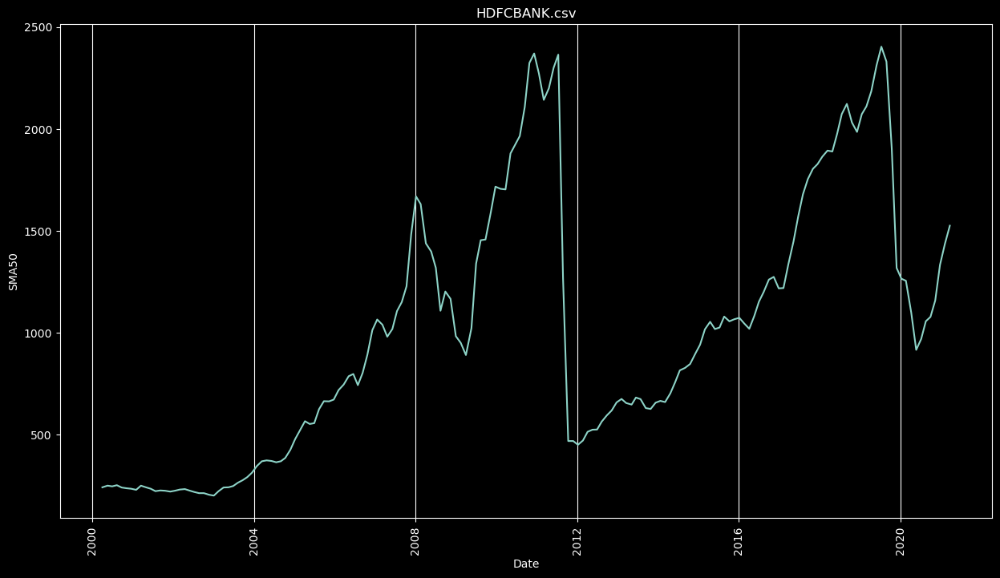

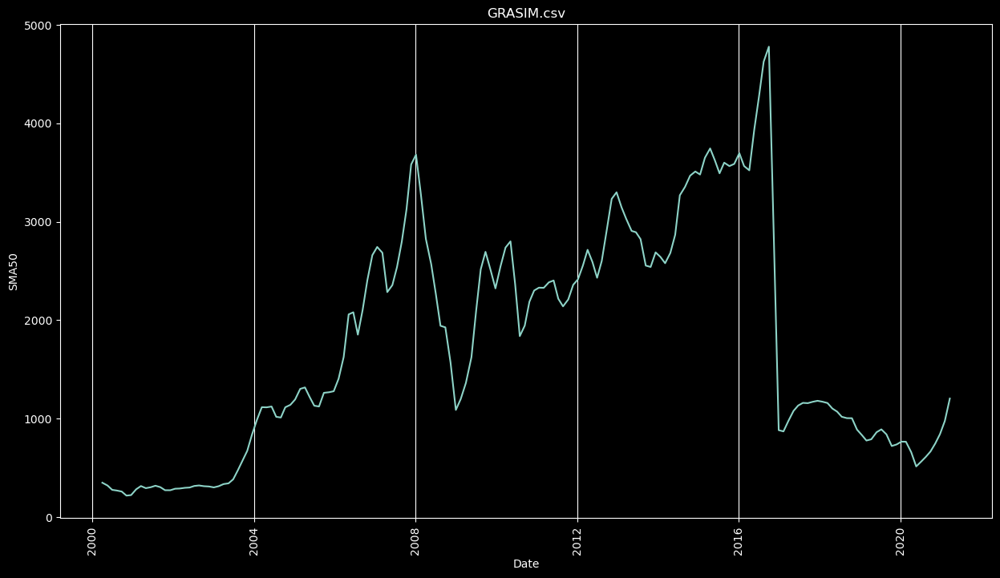

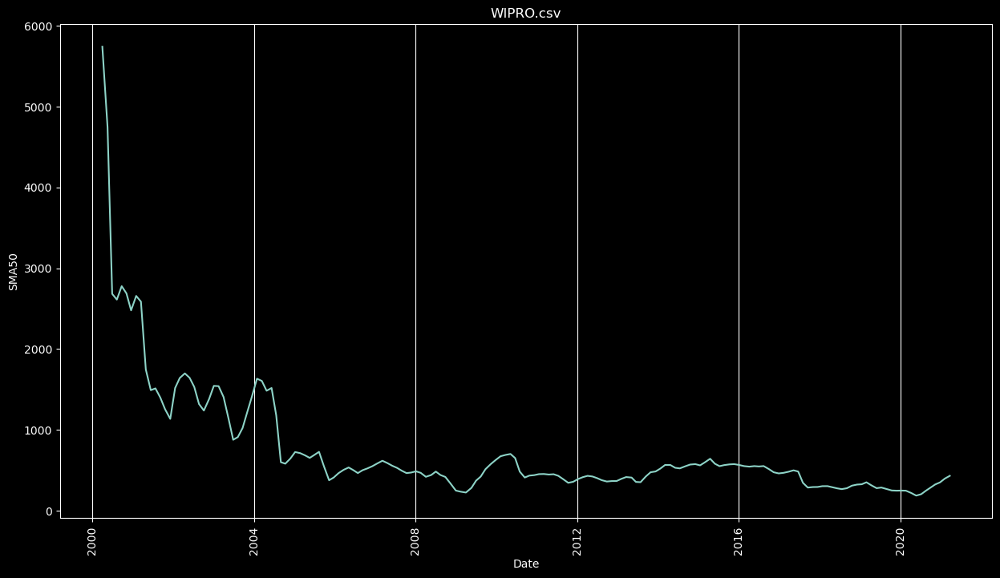

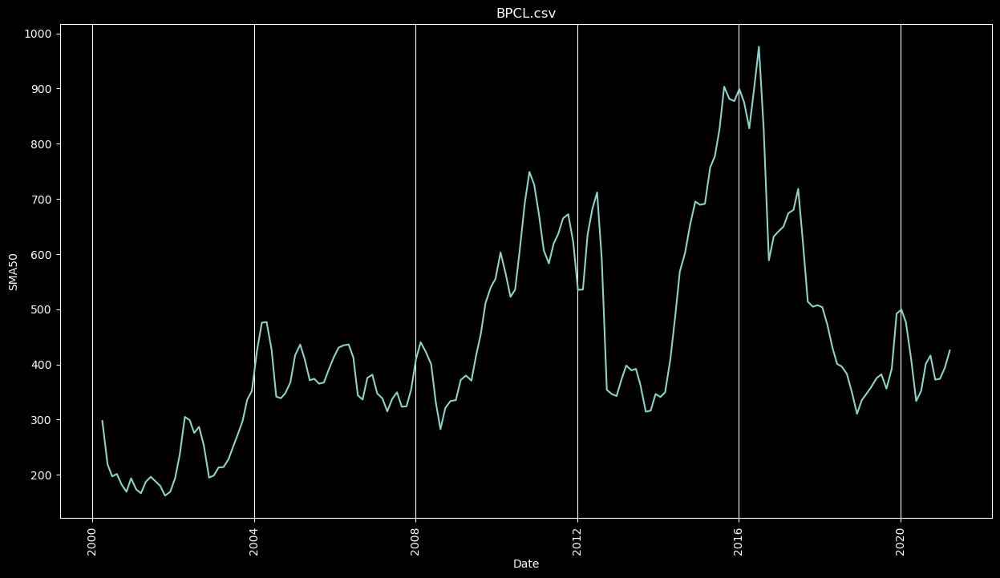

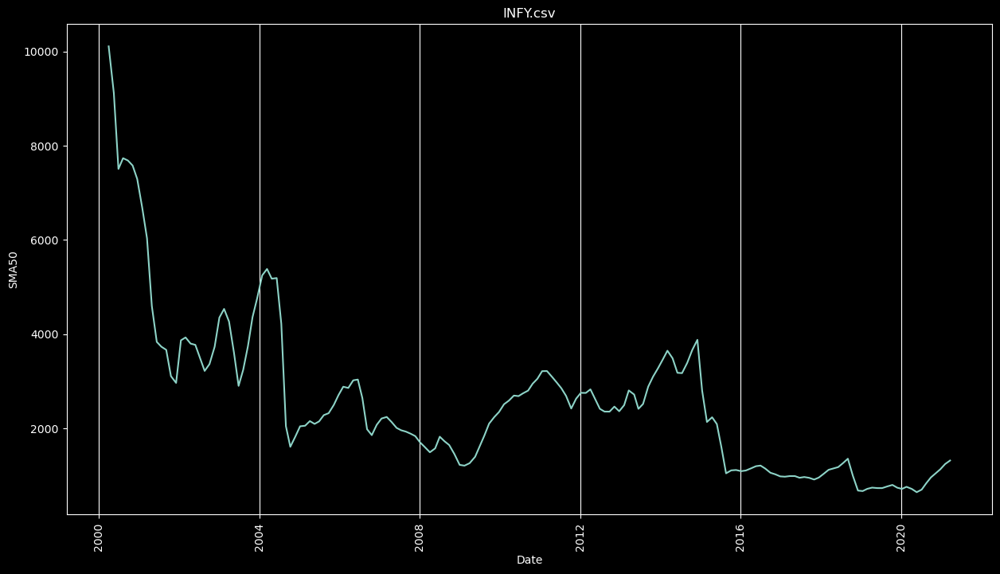

...

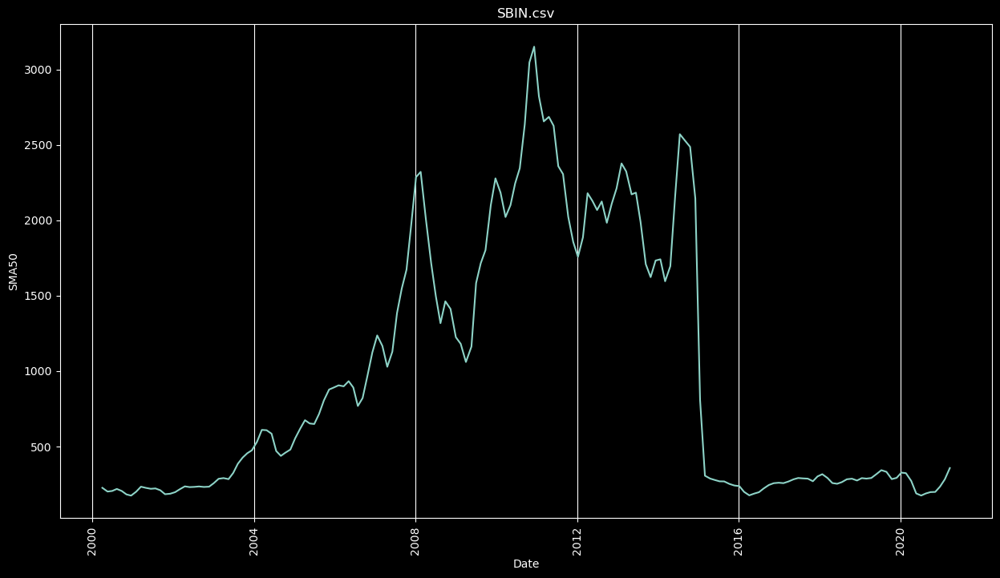

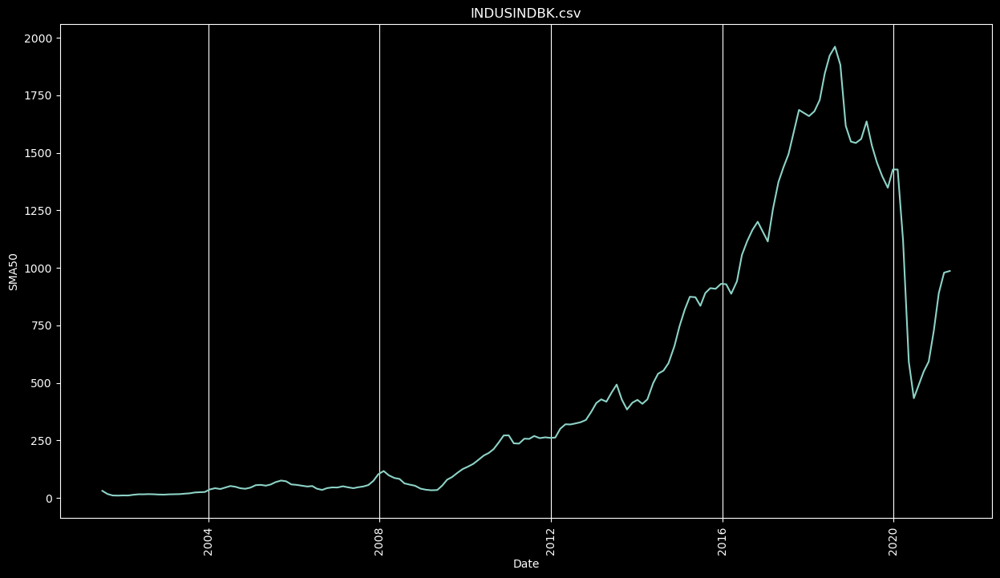

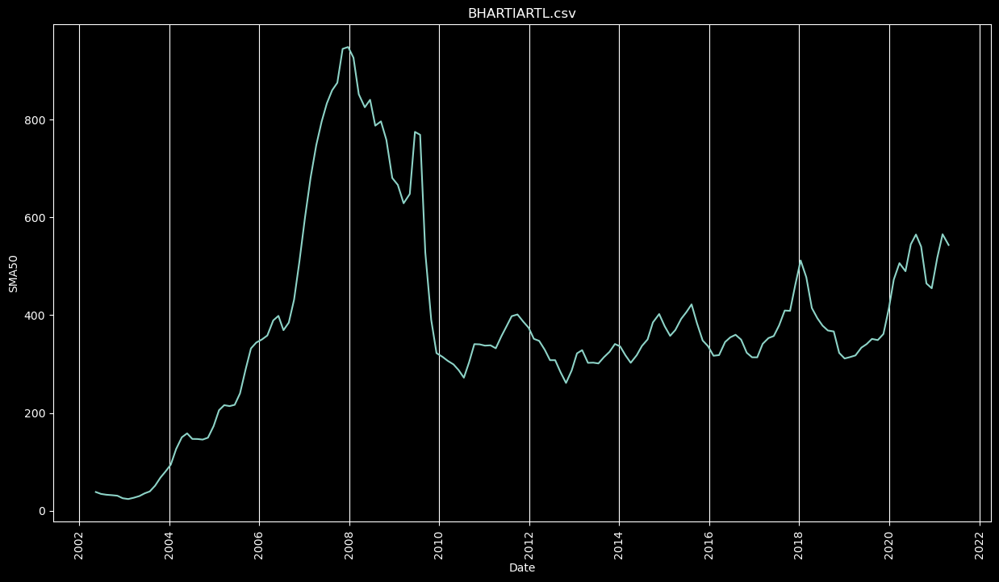

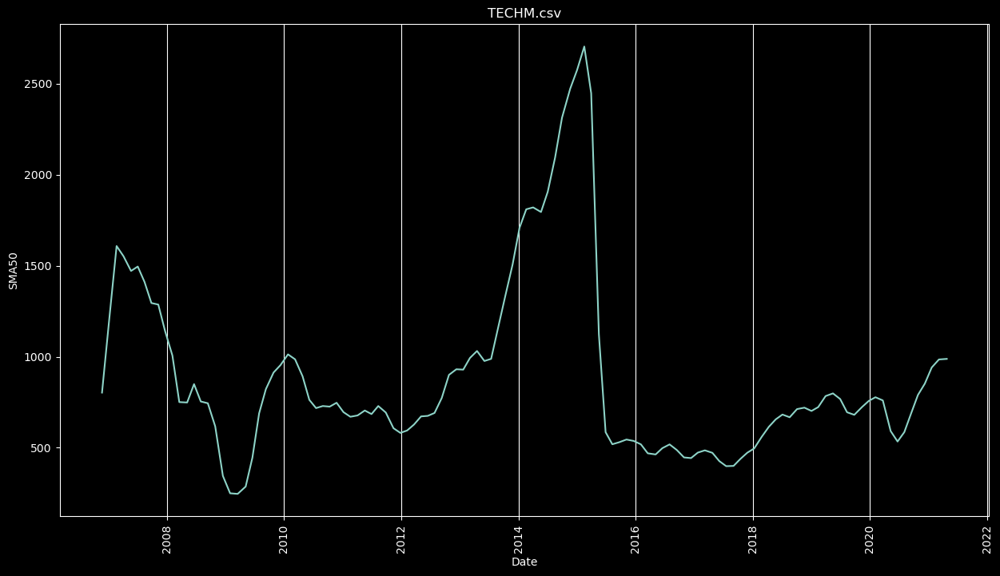

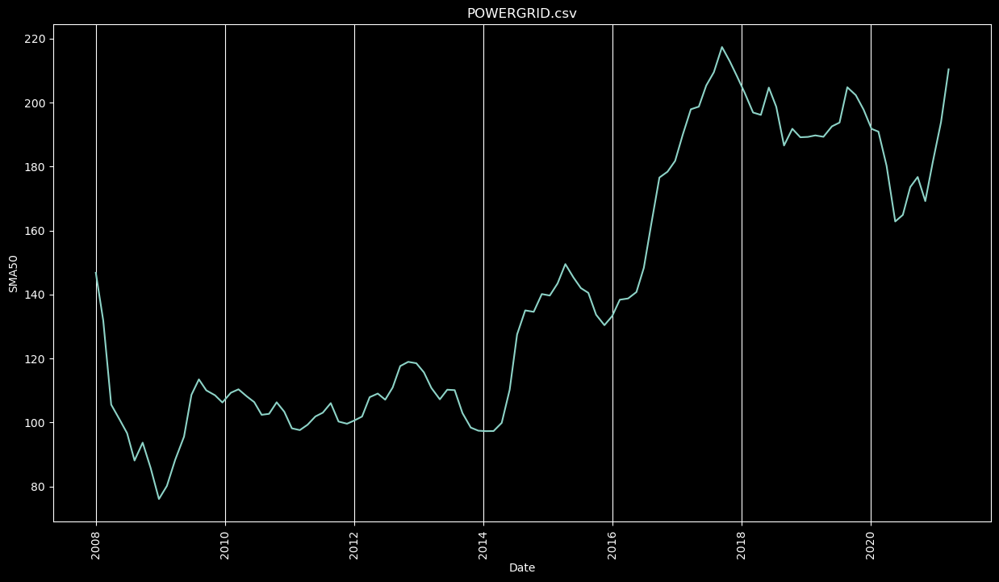

In [26]:
# SMA50 is the simple moving average of each stock

for file_name, values in df.items():
    if 'Close' in values.columns  and 'Open' in values.columns:
        values['SMA50'] = values['Close'].rolling(50).mean()
        x= values['Date'].iloc[::30]
        y= values['SMA50'].iloc[::30]
        imag = pd.DataFrame({'x': x, 'y': y})
        imag.dropna(axis=0,inplace=True)
        plt.figure(figsize = (15,8))
        plt.style.use("dark_background")
        plt.plot(imag['x'], imag['y'])
        plt.xticks(rotation = 90)
        plt.grid(axis ='x')
        plt.title(file_name)
        plt.xlabel('Date')   
        plt.ylabel('SMA50')
        plt.show()        

<h2 style="color:red;">4. Is there any seasonality effect in the returns of individual stocks? Analyze the monthly returns for each stock and identify any recurring patterns or trends</h3>


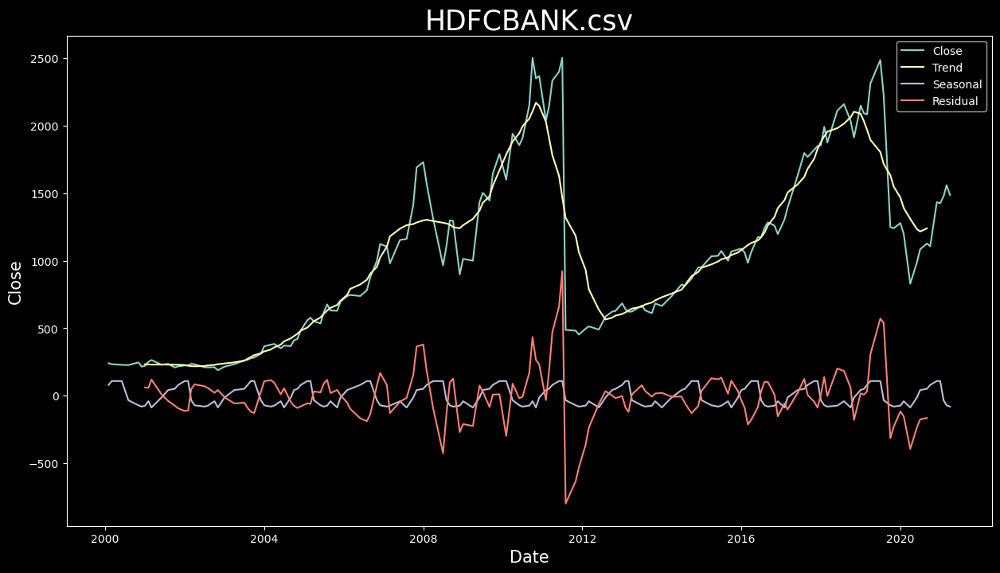

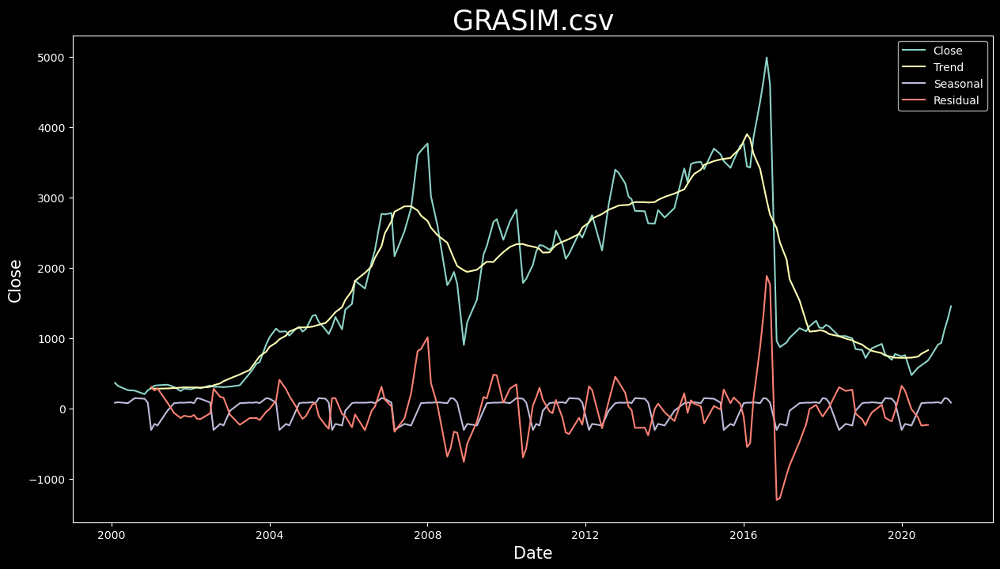

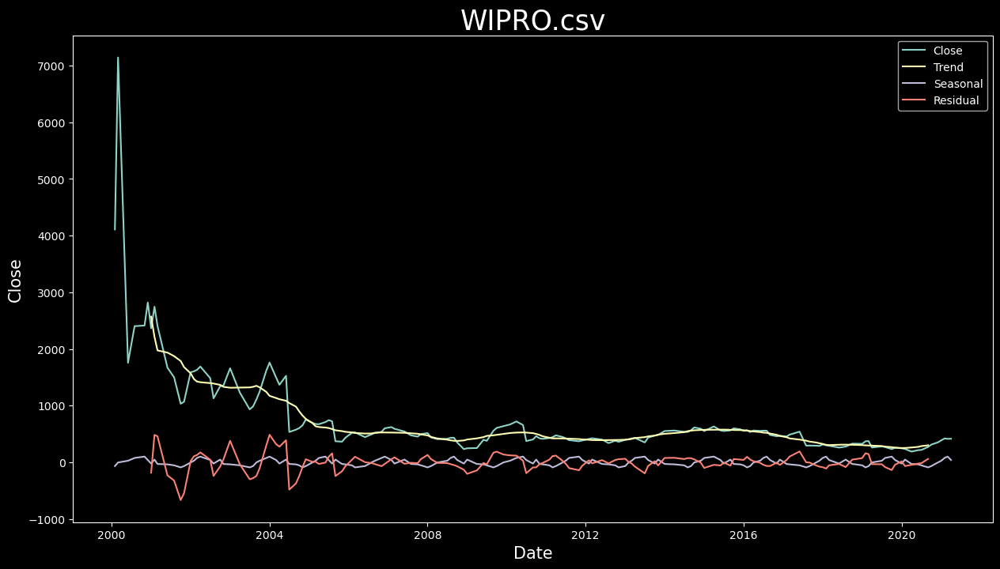

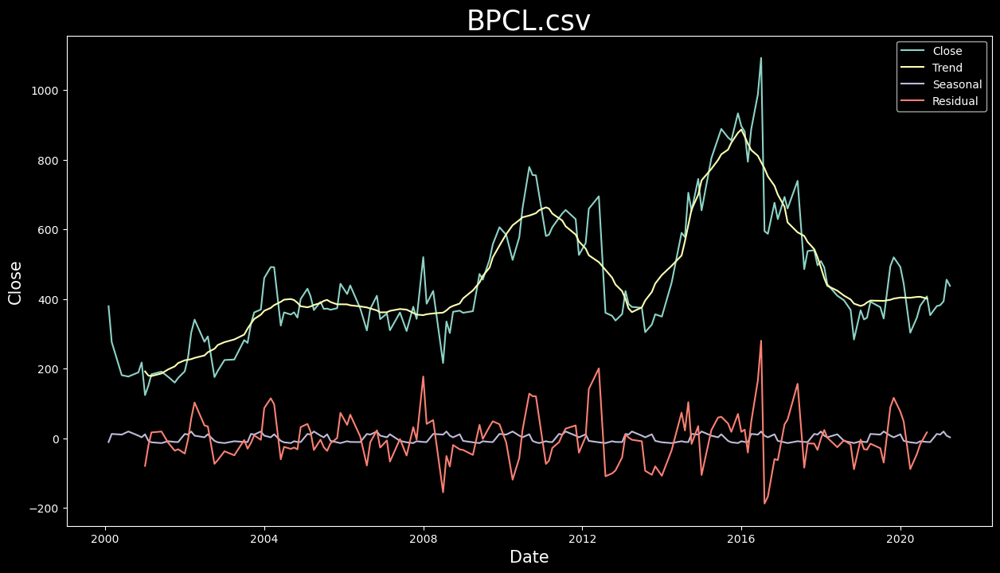

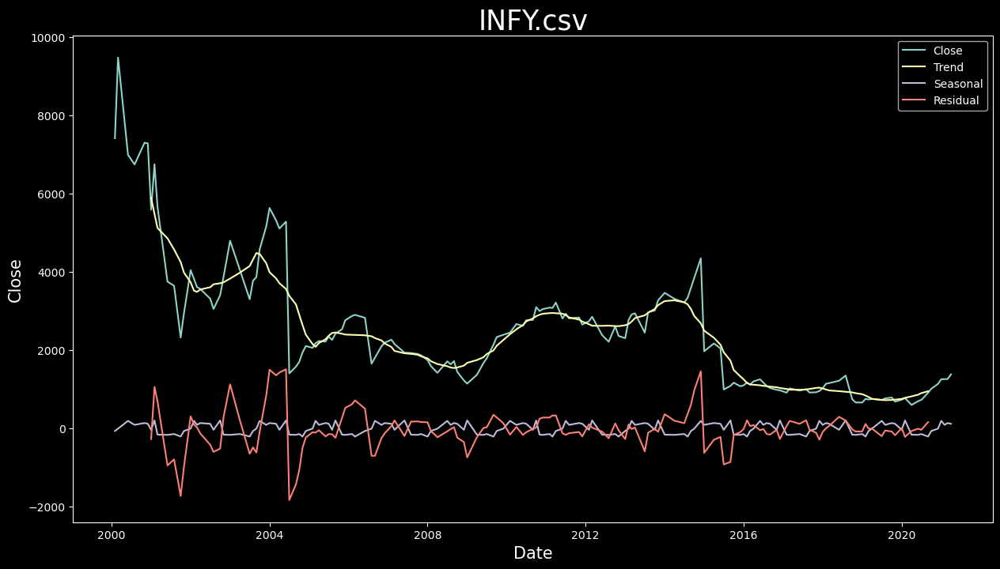

...

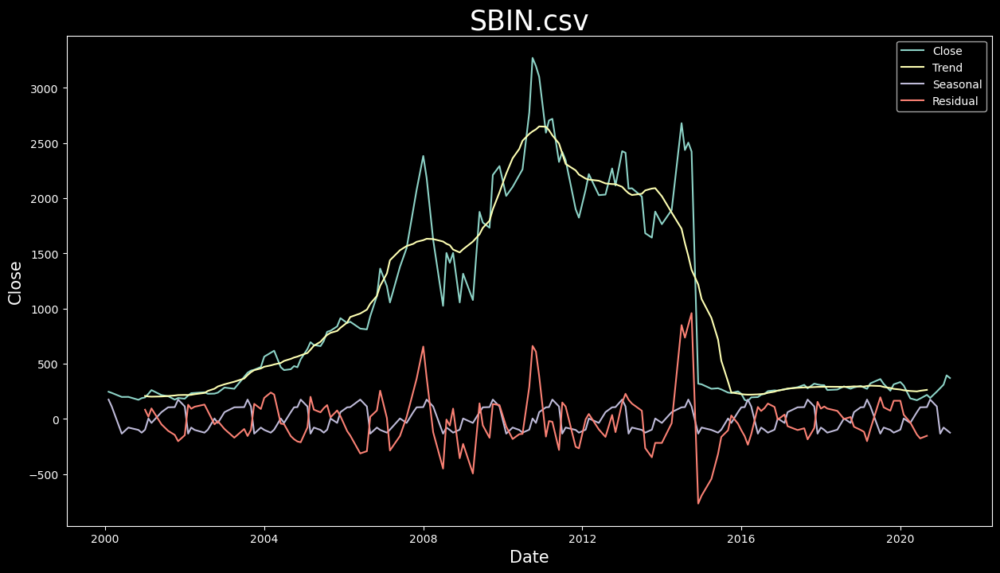

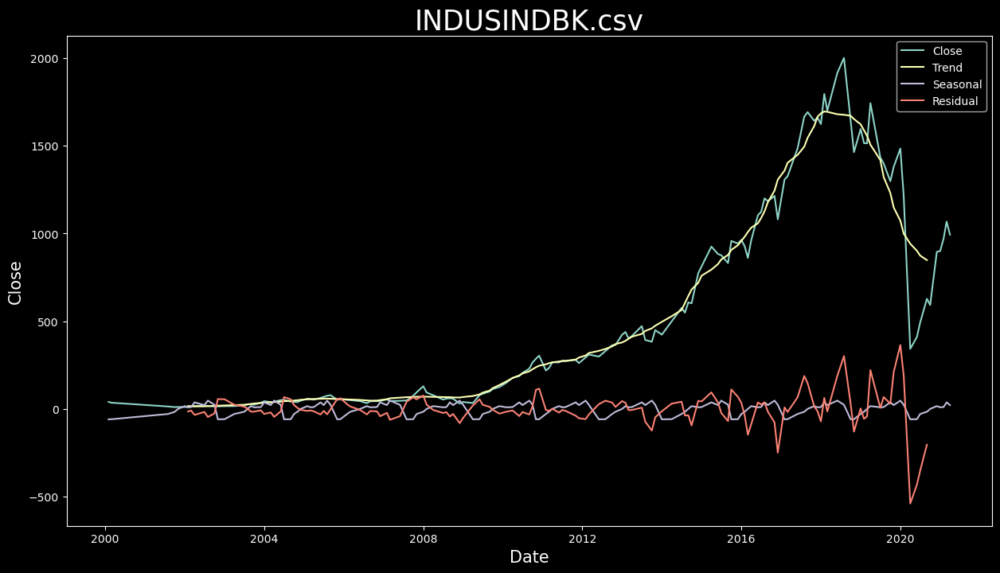

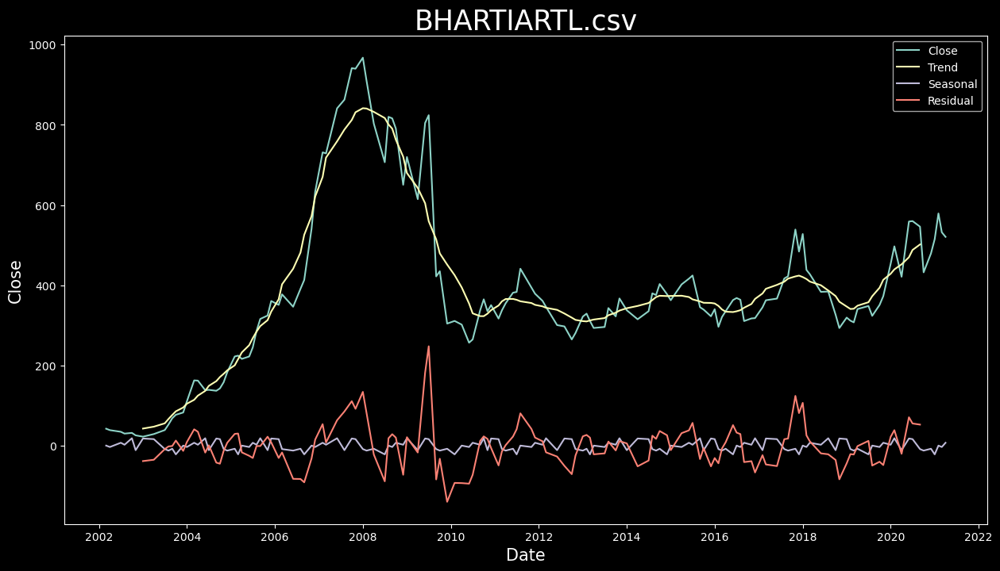

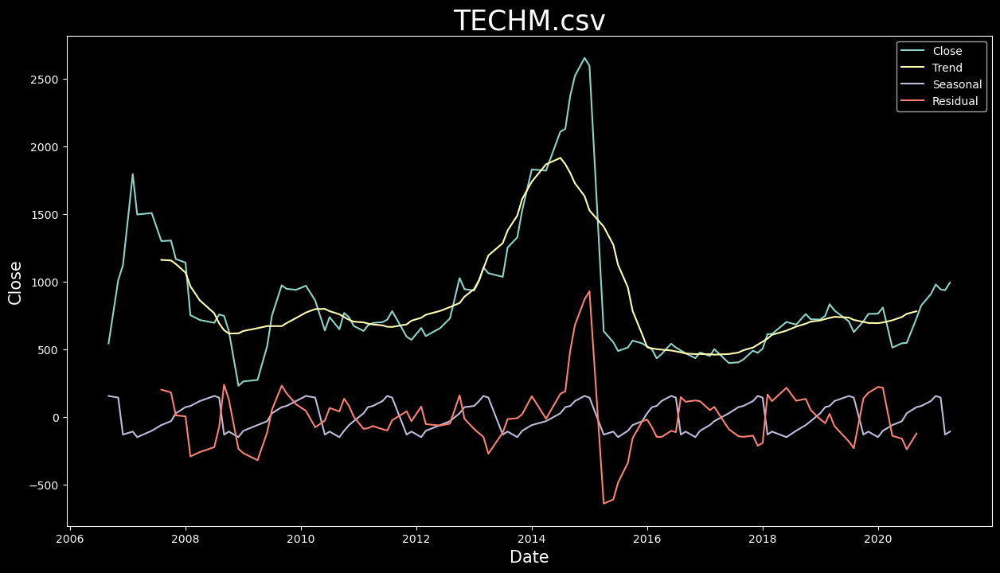

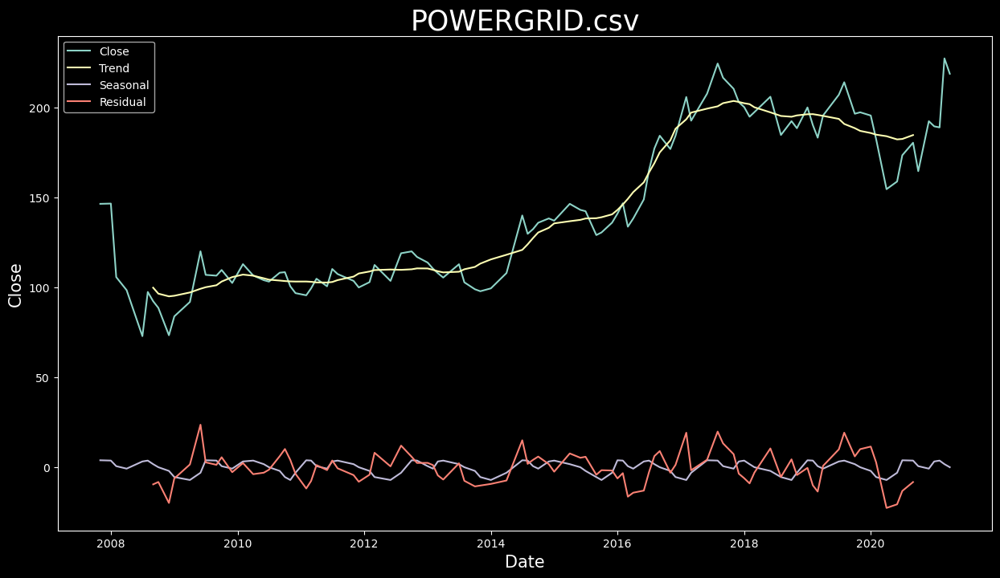

In [31]:

for i, (file_name, values) in enumerate(df.items()):
    if 'Close' in values.columns:
        condition = values['Date'].dt.day == 1
        extracted_df = values.loc[condition, ['Date','Close']]
        extracted_df.dropna(axis=0, inplace=True)         
        extracted_df.index = pd.to_datetime(extracted_df['Date'])
        if len(extracted_df) >= 12:
            decompose_result = seasonal_decompose(np.asarray(extracted_df['Close']), model='additive', period=12)
            # Plot decomposition components
            plt.figure(figsize = (15,8))
            plt.style.use("dark_background")
            plt.title(file_name,fontsize = 25)
            plt.xlabel('Date',fontsize = 15)   
            plt.ylabel('Close',fontsize = 15)
            plt.plot(extracted_df.index, extracted_df['Close'], label='Close')
            plt.plot(extracted_df.index, decompose_result.trend, label='Trend')
            plt.plot(extracted_df.index, decompose_result.seasonal, label='Seasonal')
            plt.plot(extracted_df.index, decompose_result.resid, label='Residual')
            plt.legend()
            plt.show()